In [ ]:
# Importing required libraries.
import pandas as pd
import numpy as np
import seaborn as sns #visualisation
import matplotlib.pyplot as plt #visualisation
%matplotlib inline
sns.set(color_codes=True)

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
#import os
import cv2
#import numpy as np
#import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

In [ ]:
!pip install kaggle


In [ ]:
from google.colab import files
files.upload()

{}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#downloading the kaggle dataset directly from Kaggle
!kaggle datasets download -d shivamardeshna/real-and-fake-images-dataset-for-image-forensics

Dataset URL: https://www.kaggle.com/datasets/shivamardeshna/real-and-fake-images-dataset-for-image-forensics
License(s): apache-2.0
100% 2.75G/2.76G [00:37<00:00, 88.4MB/s]
100% 2.76G/2.76G [00:38<00:00, 77.9MB/s]


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!unzip real-and-fake-images-dataset-for-image-forensics.zip -d /content/drive/MyDrive/w210


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17727.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17728.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17729.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_1773.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17730.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17731.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17732.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17733.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17734.jpg  
  inflating: /content/drive/MyDrive/w210/Data Set 4/Data Set 4/validation/real/real_17

In [ ]:
#downloading another kaggle dataset directly from Kaggle
!kaggle datasets download -d ciplab/real-and-fake-face-detection

Dataset URL: https://www.kaggle.com/datasets/ciplab/real-and-fake-face-detection
License(s): CC-BY-NC-SA-4.0
 99% 426M/431M [00:03<00:00, 154MB/s]
100% 431M/431M [00:03<00:00, 137MB/s]


In [ ]:
!unzip /content/real-and-fake-face-detection.zip -d /content/drive/MyDrive/w210


In [ ]:
#downloading a third kaggle dataset directly from Kaggle
!kaggle datasets download -d hearfool/vggface2


Dataset URL: https://www.kaggle.com/datasets/hearfool/vggface2
License(s): unknown
100% 2.32G/2.32G [01:18<00:00, 26.0MB/s]
100% 2.32G/2.32G [01:18<00:00, 31.6MB/s]


In [ ]:
!unzip /content/vggface2.zip -d /content/drive/MyDrive/w210


Archive:  /content/vggface2.zip
replace /content/drive/MyDrive/w210/train/n000002/0001_01.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: /content/drive/MyDrive/w210/train/n000002/0001_01.jpg  
replace /content/drive/MyDrive/w210/train/n000002/0002_01.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

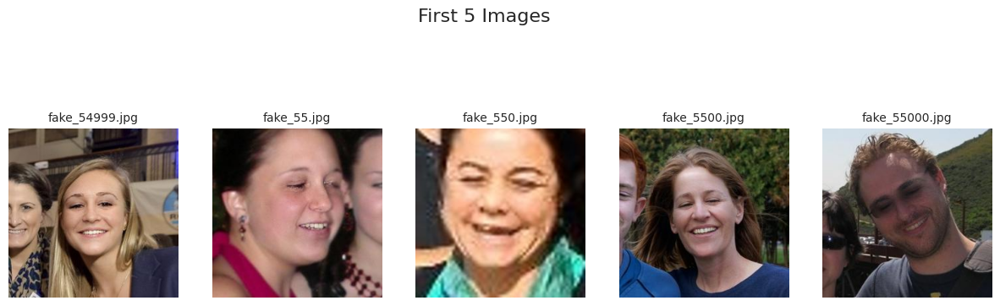

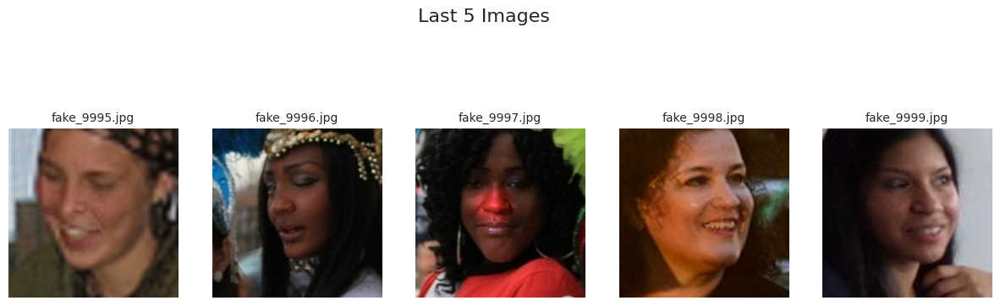

In [ ]:
# Define the dataset directory
dataset_dir = "/content/drive/MyDrive/w210/Data Set 1/Data Set 1/train/fake"

# Get the first and last 5 images
image_files_first = sorted(os.listdir(dataset_dir))[:5]  # First 5 images
image_files_last = sorted(os.listdir(dataset_dir))[-5:]  # Last 5 images

# Function to display images
def display_images(image_files, title):
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    fig.suptitle(title, fontsize=16)  # Add title

    for ax, img_file in zip(axes, image_files):
        img_path = os.path.join(dataset_dir, img_file)
        img = Image.open(img_path)

        ax.imshow(img)
        ax.set_title(img_file, fontsize=10)
        ax.axis("off")

    plt.show()

# Display first 5 images
display_images(image_files_first, "First 5 Images")

# Display last 5 images
display_images(image_files_last, "Last 5 Images")

In [ ]:
# Define dataset path
dataset_dir = "/content/drive/MyDrive/w210/Data Set 1/Data Set 1/train/fake"

In [ ]:


# Get all files
files = os.listdir(dataset_dir)

# Get unique file extensions
extensions = set([os.path.splitext(f)[1] for f in files])

print("Unique file types:", extensions)

Unique file types: {'.jpg'}


In [ ]:
#to check image size and grayscale vs RGB
image_shapes = []
image_modes = []

for file in files[:100]:  # Check the first 100 images
    file_path = os.path.join(dataset_dir, file)

    try:
        img = Image.open(file_path)
        image_shapes.append(img.size)  # (width, height)
        image_modes.append(img.mode)  # 'RGB' or 'L' (grayscale)
    except:
        print(f"Skipping non-image file: {file}")

# Convert to DataFrame
df = pd.DataFrame({'Shape': image_shapes, 'Mode': image_modes})

print(df.head())
print("\nUnique Image Shapes:", df['Shape'].value_counts())
print("\nUnique Image Modes:", df['Mode'].value_counts())

        Shape Mode
0  (256, 256)  RGB
1  (256, 256)  RGB
2  (256, 256)  RGB
3  (256, 256)  RGB
4  (256, 256)  RGB

Unique Image Shapes: Shape
(256, 256)    100
Name: count, dtype: int64

Unique Image Modes: Mode
RGB    100
Name: count, dtype: int64


In [ ]:
# check for corrupt of unreadable images
corrupt_files = []

for file in files:
    file_path = os.path.join(dataset_dir, file)
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify image integrity
    except:
        corrupt_files.append(file)

print("Corrupted files:", corrupt_files)

In [ ]:
# if corrupt images are found, remove them
for file in corrupt_files:
    os.remove(os.path.join(dataset_dir, file))

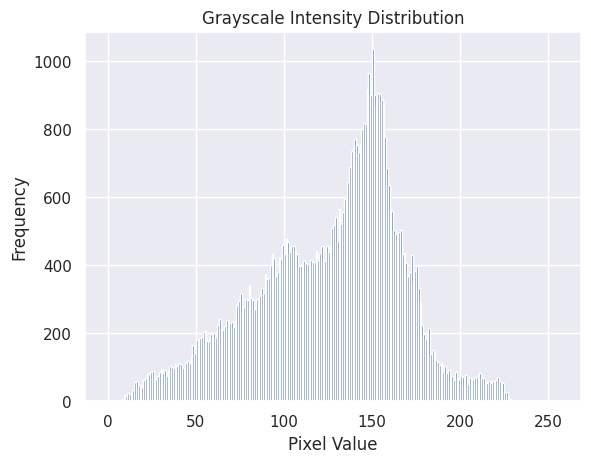

In [ ]:
# Get all files
files = os.listdir(dataset_dir)

#analyze image. brightness and color distribution
import cv2
#import matplotlib.pyplot as plt

# Load an image and convert it to grayscale
image_sample = cv2.imread(os.path.join(dataset_dir, files[0]), cv2.IMREAD_GRAYSCALE)

plt.hist(image_sample.ravel(), bins=256, range=[0,256])
plt.title("Grayscale Intensity Distribution")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

In [ ]:
# the full set of images############
import os
import pickle
from PIL import Image
import numpy as np

# Define the root directory (Only needed once)
root_directory = '/content/drive/MyDrive/w210'

# Collect and save all images directly as arrays
image_data = []  # To store image arrays and file names

for dirpath, _, filenames in os.walk(root_directory):
    for filename in filenames:
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(dirpath, filename)
            try:
                img = Image.open(image_path).convert('RGB')
                img_array = np.array(img)
                image_data.append((filename, img_array))
            except Exception as e:
                print(f"Error loading {image_path}: {e}")

# Save the image data as a pickle file
with open('image_data.pkl', 'wb') as f:
    pickle.dump(image_data, f)

print(f"Saved {len(image_data)} images to 'image_data.pkl'.")

In [ ]:
#small set of images#######
import os
import pickle
from PIL import Image
import numpy as np

# Define the root directory
root_directory = '/content/drive/MyDrive/w210'

# Collect and save only a limited number of images
image_data = []  # To store image arrays and file names
sample_size = 50  # Set the desired sample size

for dirpath, _, filenames in os.walk(root_directory):
    for filename in filenames:
        if len(image_data) >= sample_size:
            break  # Stop when the sample size is reached
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(dirpath, filename)
            try:
                img = Image.open(image_path).convert('RGB')
                img_array = np.array(img)
                image_data.append((filename, img_array))
            except Exception as e:
                print(f"Error loading {image_path}: {e}")
    if len(image_data) >= sample_size:
        break  # Additional break to handle nested directories

# Save the image data as a pickle file
sample_filename = 'image_data_sample.pkl'
with open(sample_filename, 'wb') as f:
    pickle.dump(image_data, f)

print(f"Saved {len(image_data)} sample images to '{sample_filename}'.")

Saved 50 sample images to 'image_data_sample.pkl'.


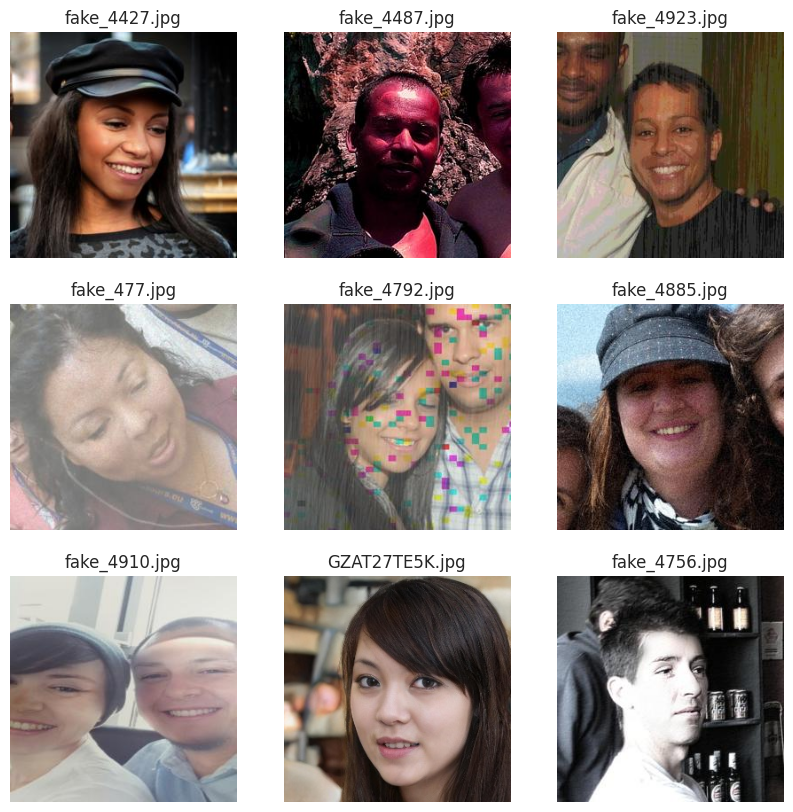

In [ ]:
# Display a few sample images
plt.figure(figsize=(10, 10))
for i, (filename, img_array) in enumerate(image_data[:9]):
    plt.subplot(3, 3, i + 1)
    plt.imshow(img_array)
    plt.axis('off')
    plt.title(filename)
plt.show()

In [ ]:
# Load the image data directly from the pickle file
with open('image_data.pkl', 'rb') as f:
    image_data = pickle.load(f)

print(f"Loaded {len(image_data)} images from 'image_data.pkl'.")

FileNotFoundError: [Errno 2] No such file or directory: 'image_data.pkl'

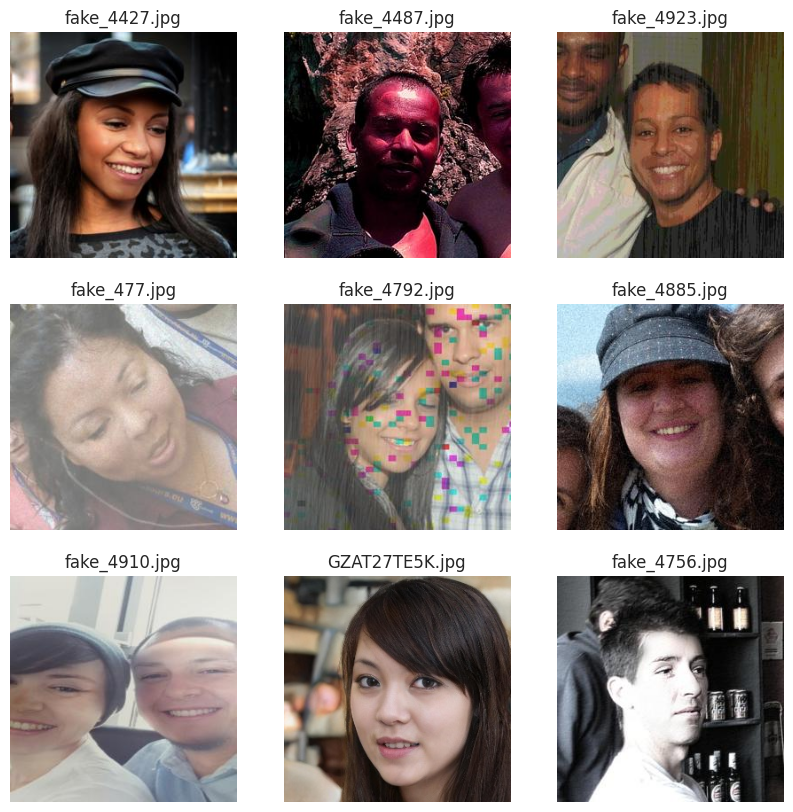

In [ ]:
import matplotlib.pyplot as plt

# Display a few sample images 
plt.figure(figsize=(10, 10))
for i, (filename, img_array) in enumerate(image_data[:9]):
    plt.subplot(3, 3, i + 1)
    plt.imshow(img_array)
    plt.axis('off')
    plt.title(filename)
plt.show()

In [ ]:
import cv2
import matplotlib.pyplot as plt

def plot_color_distribution(image_array, filename):
    image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)

    colors = ('r', 'g', 'b')
    plt.figure(figsize=(6, 4))

    for i, color in enumerate(colors):
        histogram = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(histogram, color=color)
        plt.xlim([0, 256])

    plt.title(f'Color Distribution - {filename}')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
from skimage.feature import hog
import matplotlib.pyplot as plt
import cv2

def display_hog(image_array, filename):
    image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)
    resized_image = cv2.resize(image, (128, 128))  # Resize for consistency

    hog_features, hog_image = hog(resized_image,
                                  pixels_per_cell=(8, 8),
                                  cells_per_block=(2, 2),
                                  visualize=True,
                                  block_norm='L2-Hys')

    plt.figure(figsize=(6, 4))
    plt.imshow(hog_image, cmap='gray')
    plt.title(f'HOG Visualization - {filename}')
    plt.axis('off')
    plt.show()

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_fourier_transform(image_array, filename):
    image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

    plt.figure(figsize=(6, 4))
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title(f'Fourier Transform - {filename}')
    plt.axis('off')
    plt.show()

Processing: fake_4427.jpg


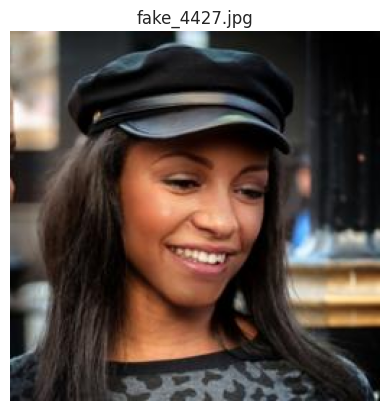

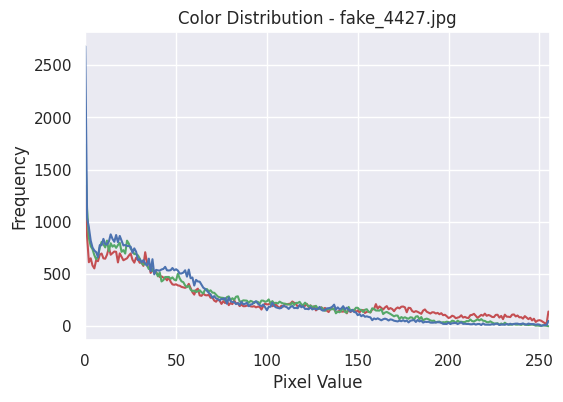

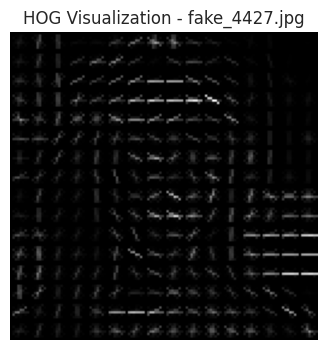

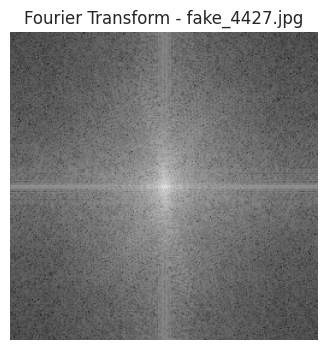

Processing: fake_4487.jpg


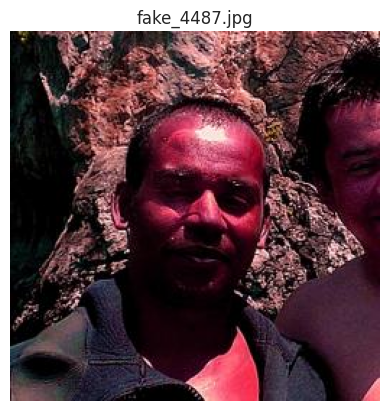

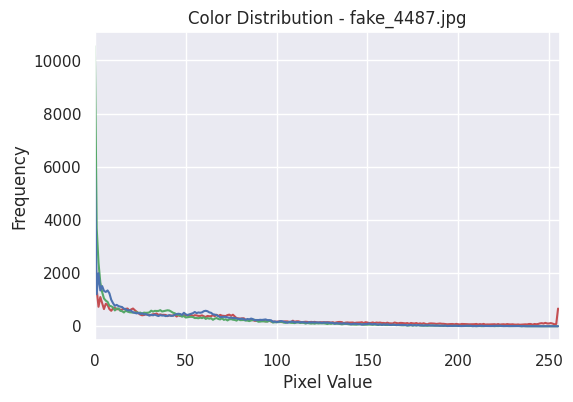

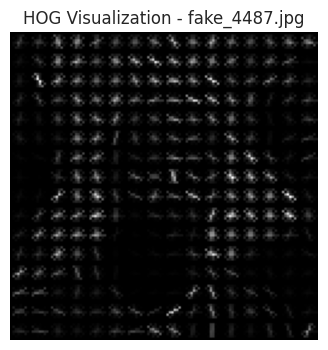

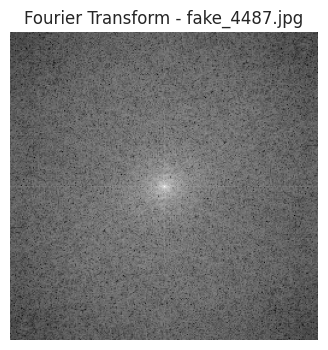

Processing: fake_4923.jpg


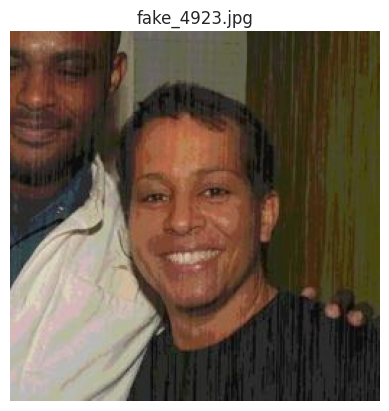

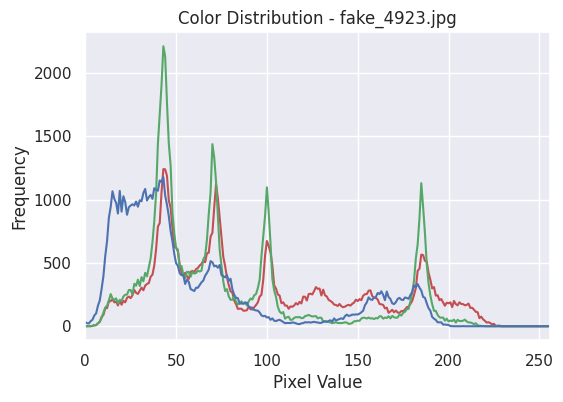

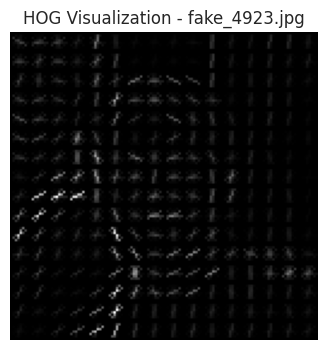

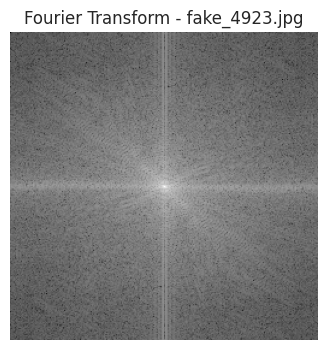

Processing: fake_477.jpg


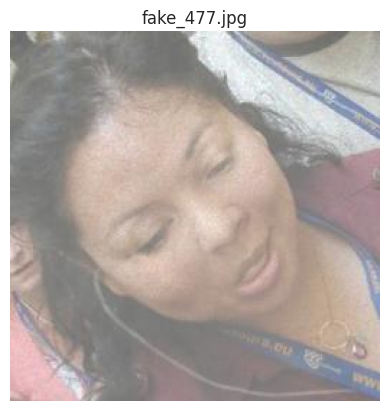

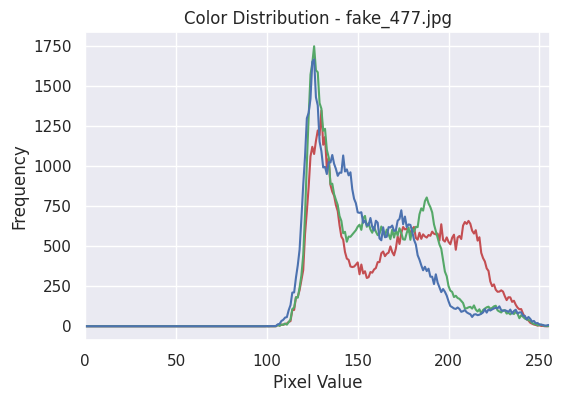

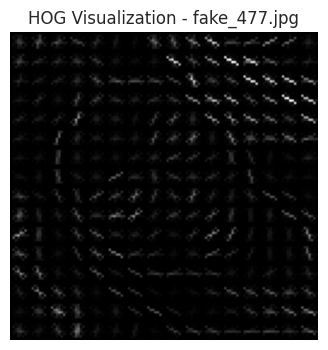

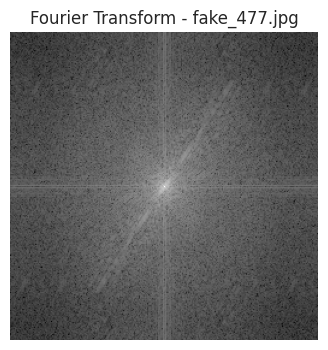

Processing: fake_4792.jpg


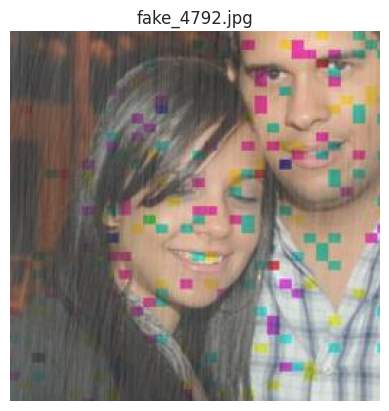

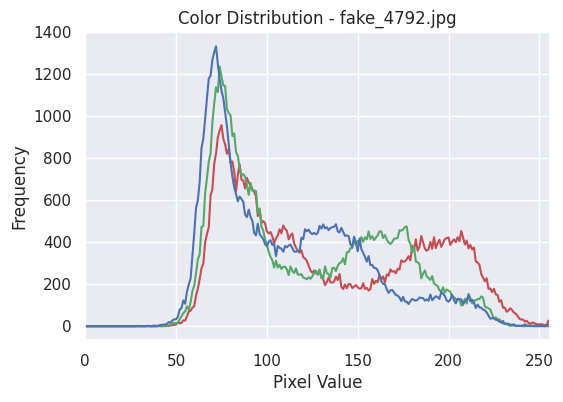

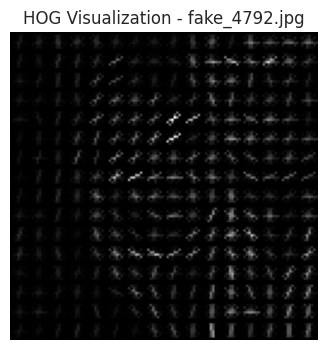

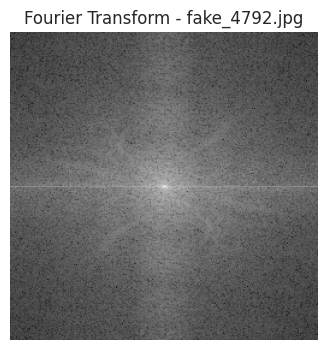

In [ ]:
for image_path in image_files[:5]:  # Adjust the number of images as needed
    print(f"Processing: {os.path.basename(image_path)}")

    # Display the image
    img = Image.open(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(os.path.basename(image_path))
    plt.show()

    # Apply Color Distribution Analysis
    plot_color_distribution(image_path)

    # Apply HOG Analysis
    display_hog(image_path)

    # Apply Fourier Transform Analysis
    plot_fourier_transform(image_path)

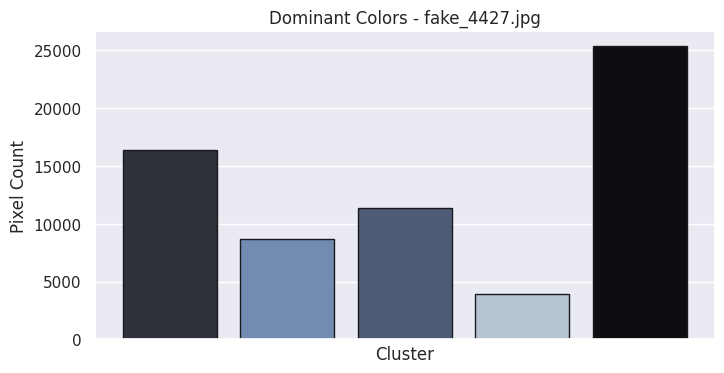

In [ ]:
def plot_dominant_colors(image_array, filename, n_colors=5):
    image = cv2.cvtColor(image_array, cv2.COLOR_RGB2BGR)
    image = image.reshape((-1, 3))  # Reshape to a list of pixels

    # Apply K-Means clustering to find dominant colors
    kmeans = KMeans(n_clusters=n_colors, random_state=42)
    kmeans.fit(image)

    colors = kmeans.cluster_centers_.astype(int)
    labels = kmeans.labels_

    # Plot the dominant colors as a bar chart
    plt.figure(figsize=(8, 4))
    plt.title(f'Dominant Colors - {filename}')

    color_counts = np.bincount(labels)
    for i, color in enumerate(colors):
        plt.bar(i, color_counts[i], color=[c / 255 for c in color], edgecolor='k')

    plt.xlabel('Cluster')
    plt.ylabel('Pixel Count')
    plt.xticks([])
    plt.show()

# Apply to a sample image
plot_dominant_colors(image_data[0][1], image_data[0][0])

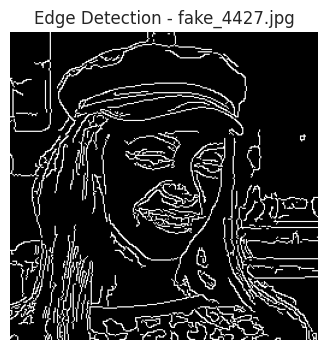

In [ ]:
def display_edge_detection(image_array, filename, low_threshold=50, high_threshold=150):
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

    # Canny Edge Detection
    edges = cv2.Canny(gray_image, low_threshold, high_threshold)

    plt.figure(figsize=(6, 4))
    plt.imshow(edges, cmap='gray')
    plt.title(f'Edge Detection - {filename}')
    plt.axis('off')
    plt.show()

# Apply to a sample image
display_edge_detection(image_data[0][1], image_data[0][0])

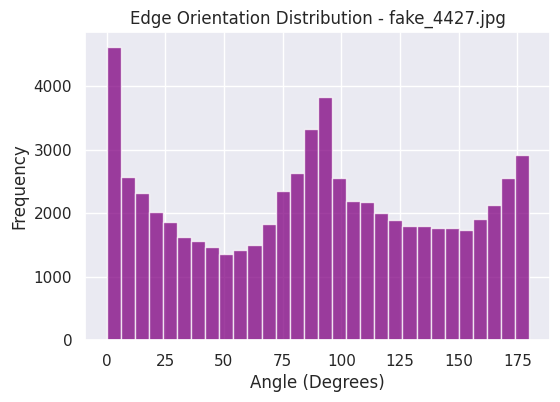

In [ ]:
def plot_edge_orientation_distribution(image_array, filename):
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

    # Compute gradients along the x and y axis
    grad_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=5)
    grad_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=5)

    # Calculate edge orientation (angle of gradients)
    orientation = np.arctan2(grad_y, grad_x) * (180 / np.pi) % 180

    plt.figure(figsize=(6, 4))
    plt.hist(orientation.ravel(), bins=30, range=(0, 180), color='purple', alpha=0.75)
    plt.title(f'Edge Orientation Distribution - {filename}')
    plt.xlabel('Angle (Degrees)')
    plt.ylabel('Frequency')
    plt.show()

# Apply to a sample image
plot_edge_orientation_distribution(image_data[0][1], image_data[0][0])

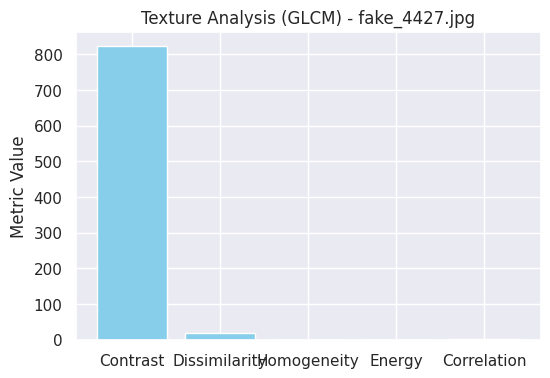

In [ ]:
from skimage.feature import graycomatrix, graycoprops

def display_texture_analysis(image_array, filename):
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)

    # Reduce image to 8-bit grayscale for GLCM analysis
    gray_image = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Calculate the GLCM matrix
    glcm = graycomatrix(gray_image,
                        distances=[5],
                        angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        symmetric=True,
                        normed=True)

    # Extract texture features
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    energy = graycoprops(glcm, 'energy')[0, 0]
    correlation = graycoprops(glcm, 'correlation')[0, 0]

    # Display texture features
    plt.figure(figsize=(6, 4))
    plt.bar(['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation'],
            [contrast, dissimilarity, homogeneity, energy, correlation],
            color='skyblue')

    plt.title(f'Texture Analysis (GLCM) - {filename}')
    plt.ylabel('Metric Value')
    plt.show()

# Apply to a sample image
display_texture_analysis(image_data[0][1], image_data[0][0])

Processing: fake_4427.jpg


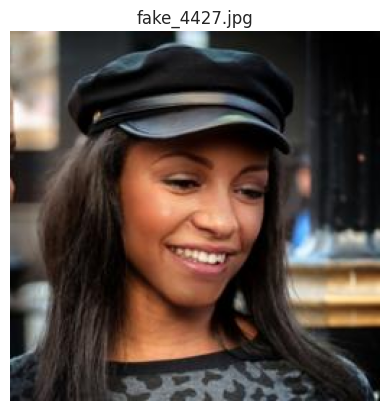

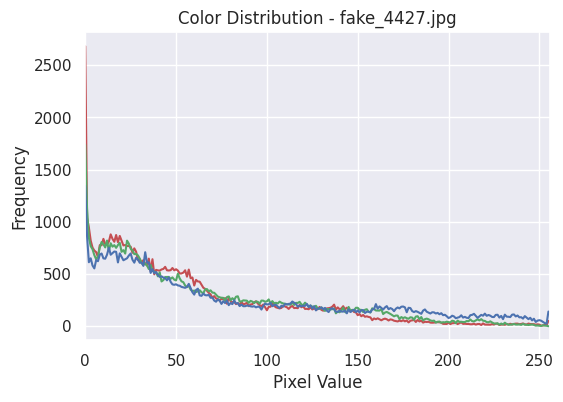

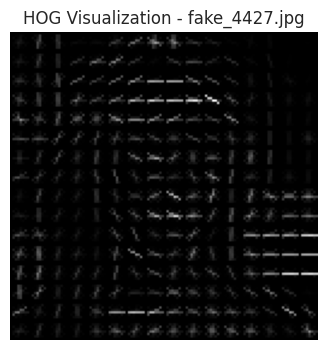

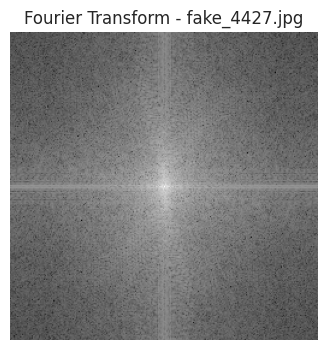

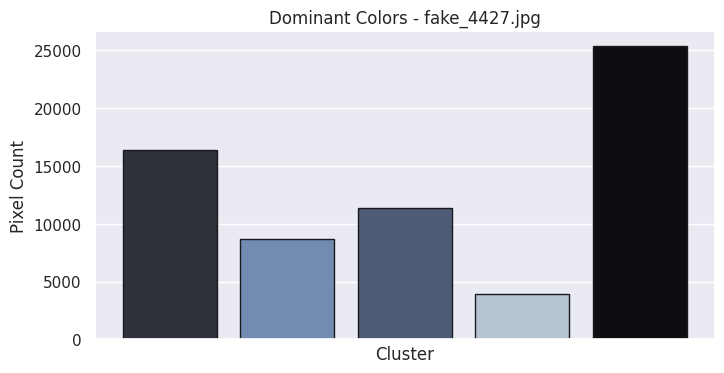

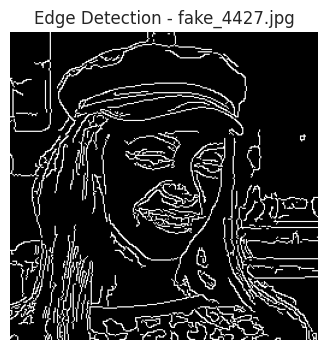

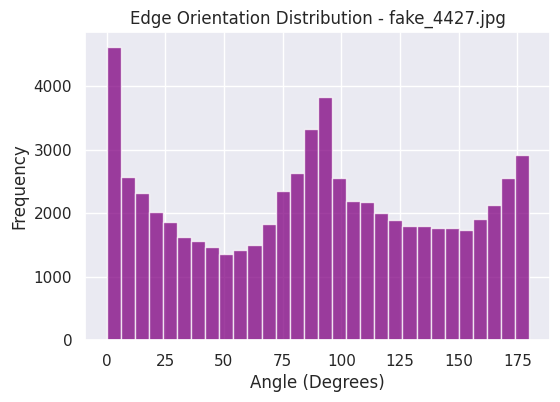

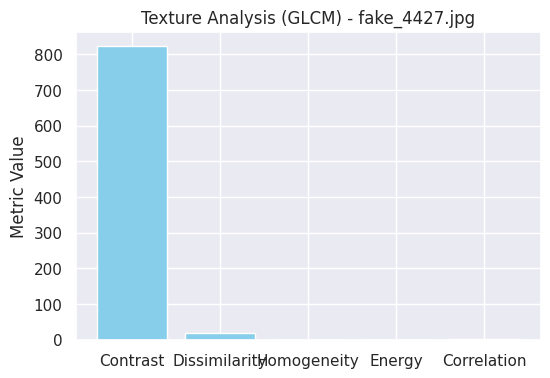

Processing: fake_4487.jpg


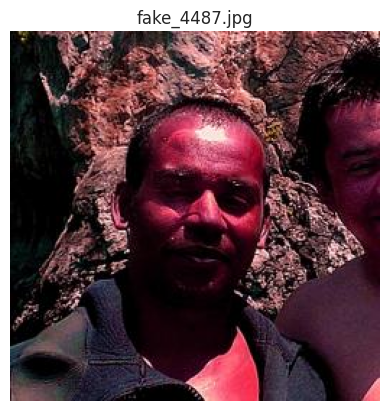

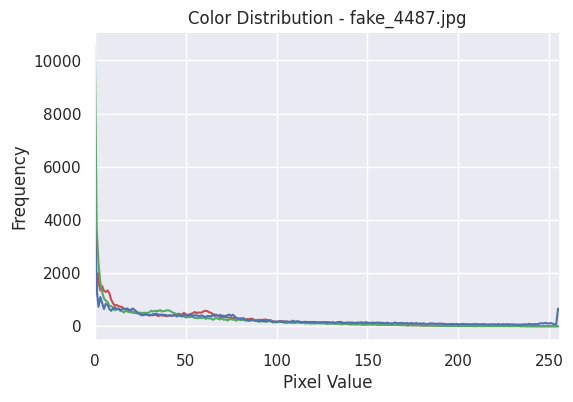

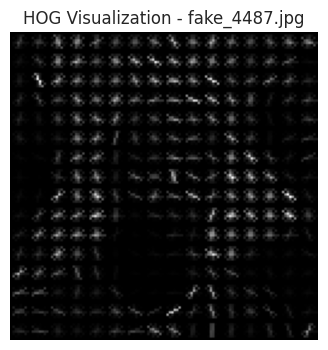

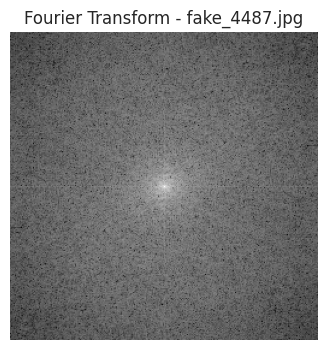

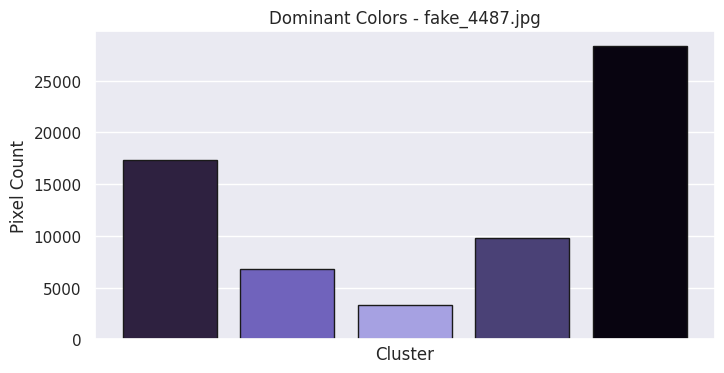

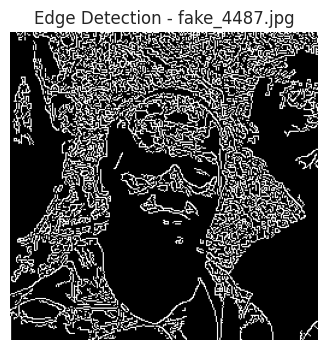

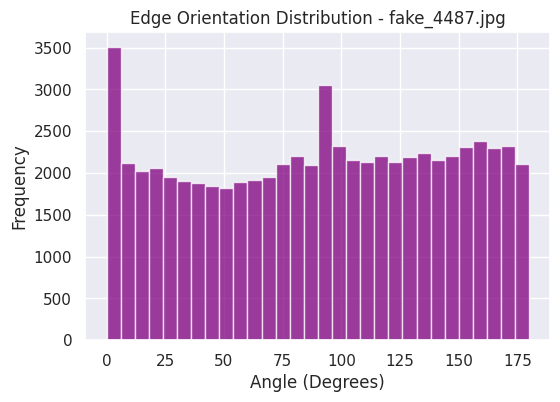

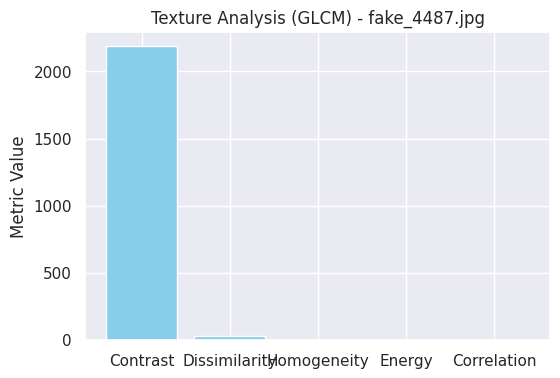

Processing: fake_4923.jpg


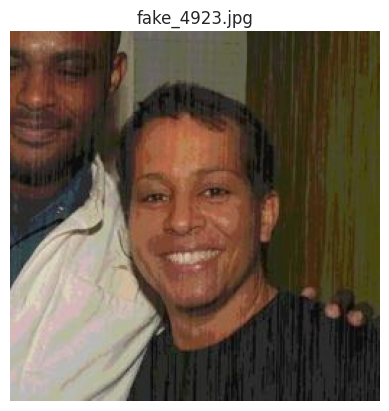

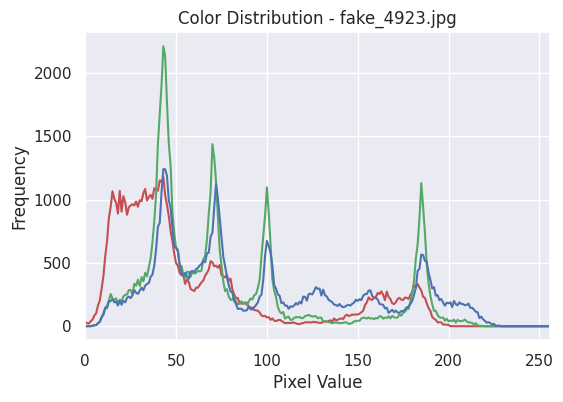

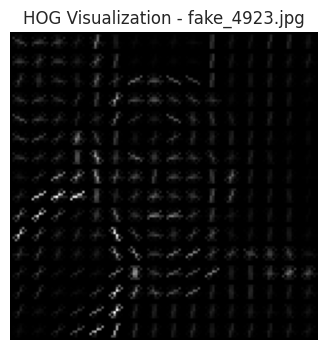

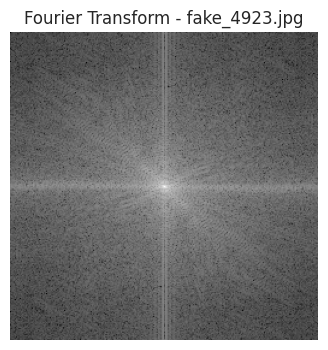

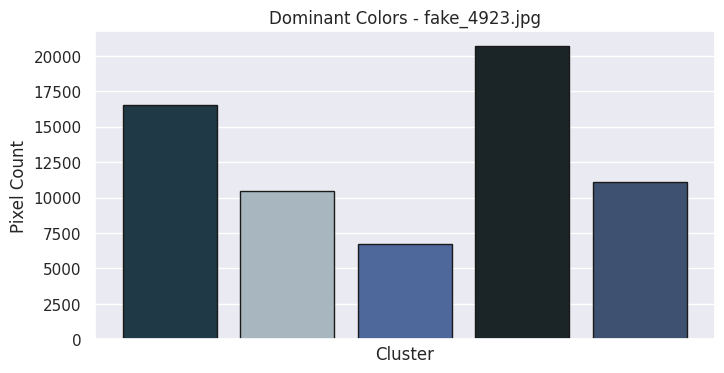

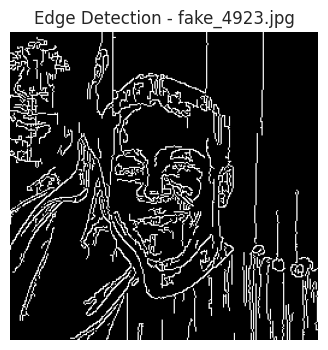

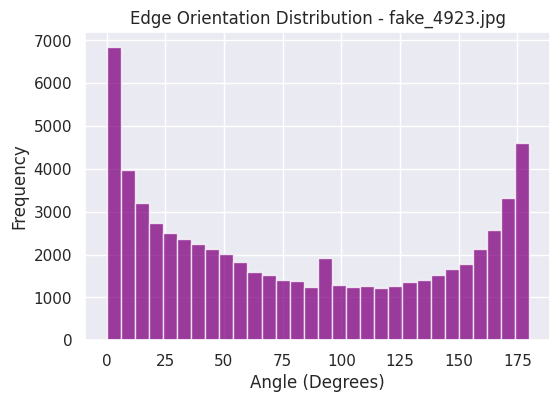

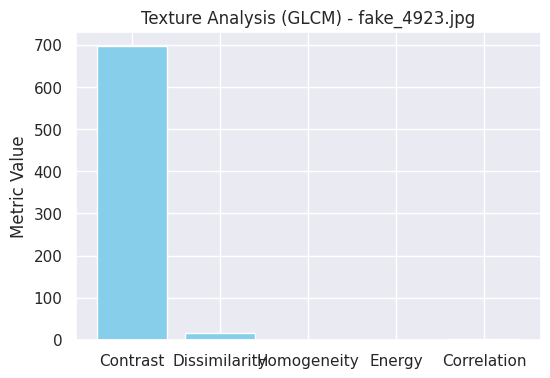

Processing: fake_477.jpg


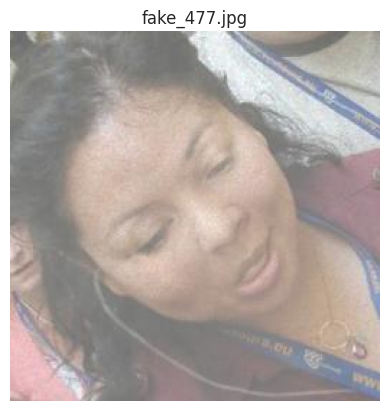

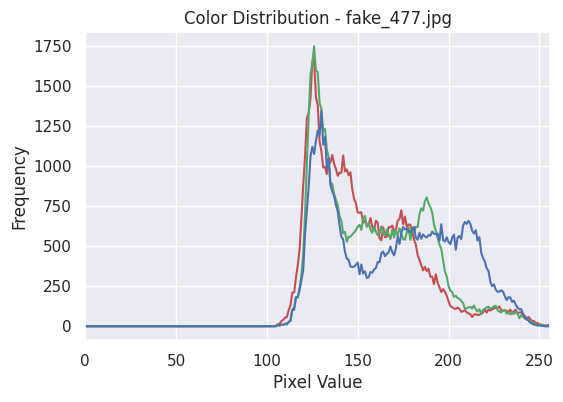

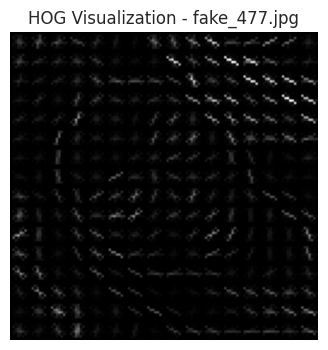

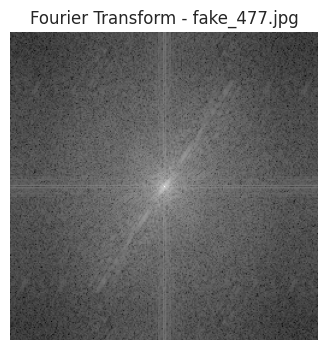

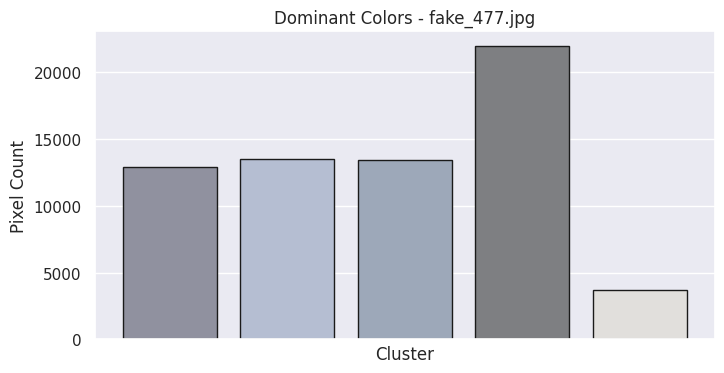

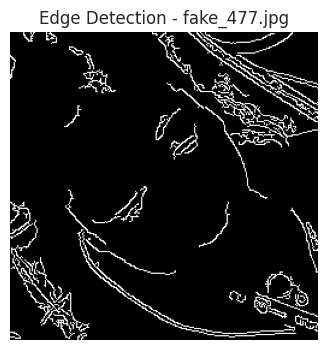

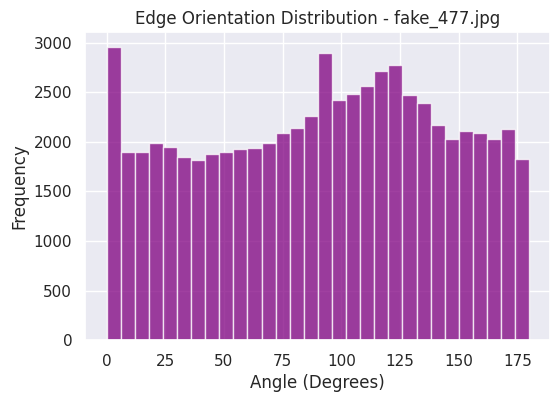

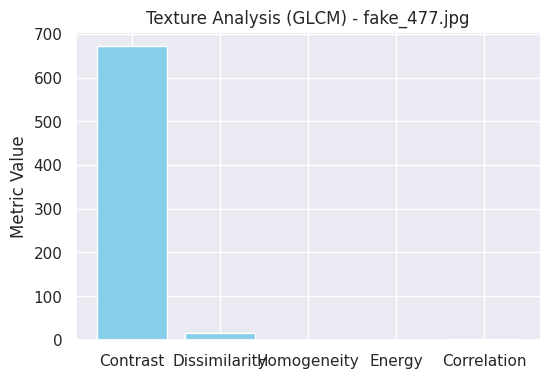

Processing: fake_4792.jpg


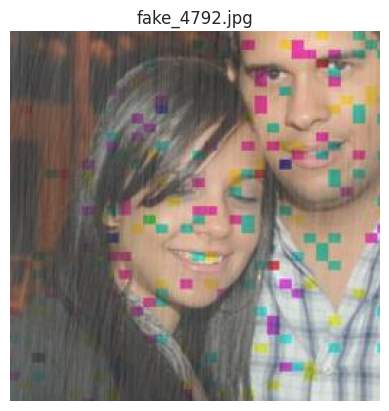

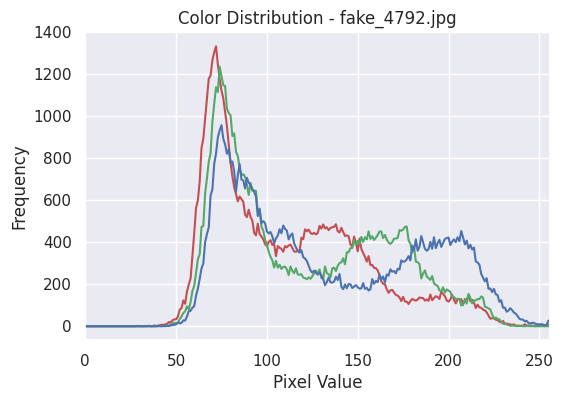

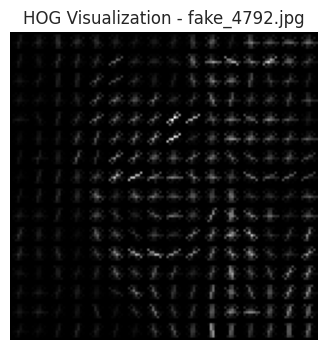

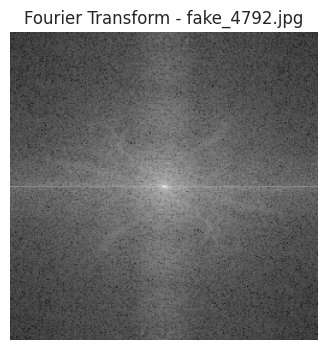

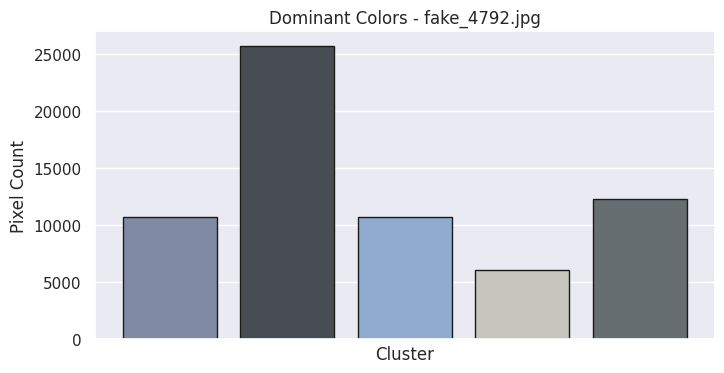

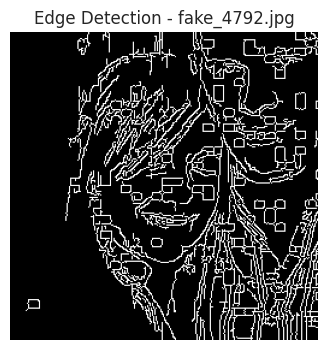

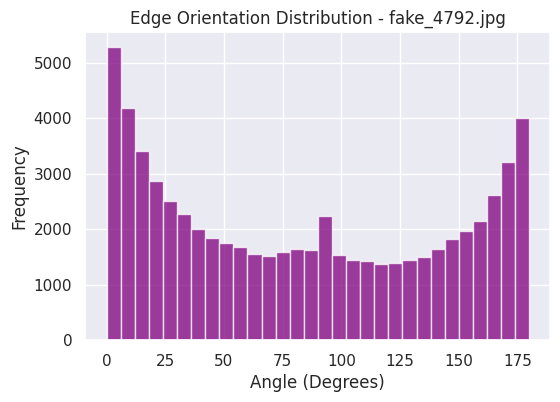

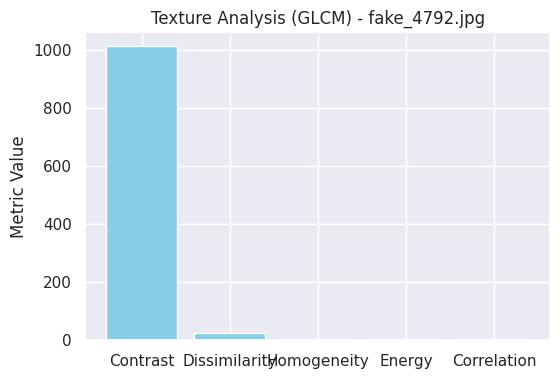

In [ ]:
for (filename, img_array) in image_data[:5]:  # Adjust batch size as needed
    print(f"Processing: {filename}")

    # Display Image
    plt.imshow(img_array)
    plt.axis('off')
    plt.title(filename)
    plt.show()

    # Apply EDA techniques
    plot_color_distribution(img_array, filename)
    display_hog(img_array, filename)
    plot_fourier_transform(img_array, filename)
    plot_dominant_colors(img_array, filename)
    display_edge_detection(img_array, filename)
    plot_edge_orientation_distribution(img_array, filename)
    display_texture_analysis(img_array, filename)

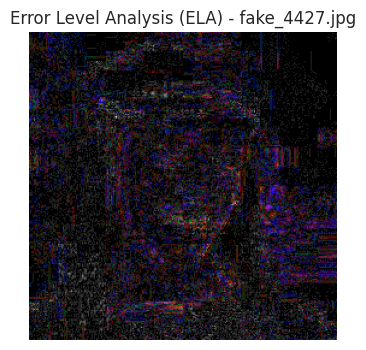

In [ ]:
### ELA highlights areas of an image that may have been altered
### by comparing the original image with a re-saved, compressed version.

from PIL import Image, ImageChops
import matplotlib.pyplot as plt

def display_error_level_analysis(image_array, filename, quality=90):
    temp_filename = 'temp_ela.jpg'

    # Save the image with reduced quality
    img = Image.fromarray(image_array)
    img.save(temp_filename, 'JPEG', quality=quality)

    # Re-open the saved image and compare with the original
    resaved_img = Image.open(temp_filename)
    ela_image = ImageChops.difference(img, resaved_img)

    # Enhance the ELA differences
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    scale = 255.0 / max_diff if max_diff != 0 else 1
    ela_image = ela_image.point(lambda p: p * scale)

    plt.figure(figsize=(6, 4))
    plt.imshow(ela_image, cmap='gray')
    plt.title(f'Error Level Analysis (ELA) - {filename}')
    plt.axis('off')
    plt.show()

# Apply to a sample image
display_error_level_analysis(image_data[0][1], image_data[0][0])

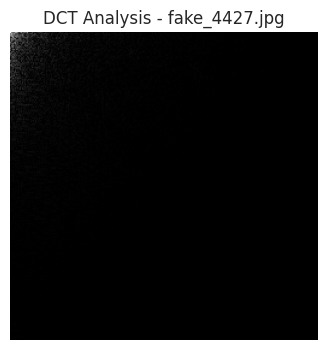

In [ ]:
def display_dct_analysis(image_array, filename):
    gray_image = cv2.cvtColor(image_array, cv2.COLOR_RGB2GRAY)
    resized_image = cv2.resize(gray_image, (256, 256))

    # Apply DCT
    dct = cv2.dct(np.float32(resized_image) / 255.0)
    magnitude_spectrum = np.log(np.abs(dct) + 1)

    plt.figure(figsize=(6, 4))
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title(f'DCT Analysis - {filename}')
    plt.axis('off')
    plt.show()

# Apply to a sample image
display_dct_analysis(image_data[0][1], image_data[0][0])

In [ ]:
#adding CelebA dataset
#downloading the kaggle dataset directly from Kaggle
!kaggle datasets download -d jessicali9530/celeba-dataset
#path = kagglehub.dataset_download("jessicali9530/celeba-dataset")

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
100% 1.33G/1.33G [01:00<00:00, 24.0MB/s]
100% 1.33G/1.33G [01:00<00:00, 23.5MB/s]


In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
#!unzip /content/drive/MyDrive/w210/celeba-dataset.zip -d /content/drive/MyDrive/w210
!unzip /content/celeba-dataset.zip -d /content/drive/MyDrive/w210


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197604.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197605.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197606.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197607.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: /content/drive/MyDrive/w210/img_align_celeba/img_align_c

In [ ]:
!unzip -l /content/celeba-dataset.zip


Streaming output truncated to the last 5000 lines.
     5703  2019-10-01 08:52   img_align_celeba/img_align_celeba/197606.jpg
    11904  2019-10-01 08:52   img_align_celeba/img_align_celeba/197607.jpg
     6609  2019-10-01 08:52   img_align_celeba/img_align_celeba/197608.jpg
     6313  2019-10-01 08:52   img_align_celeba/img_align_celeba/197609.jpg
     6899  2019-10-01 08:52   img_align_celeba/img_align_celeba/197610.jpg
     6719  2019-10-01 08:52   img_align_celeba/img_align_celeba/197611.jpg
     7634  2019-10-01 08:52   img_align_celeba/img_align_celeba/197612.jpg
     7328  2019-10-01 08:52   img_align_celeba/img_align_celeba/197613.jpg
     6909  2019-10-01 08:52   img_align_celeba/img_align_celeba/197614.jpg
     7565  2019-10-01 08:52   img_align_celeba/img_align_celeba/197615.jpg
     7300  2019-10-01 08:52   img_align_celeba/img_align_celeba/197616.jpg
     9151  2019-10-01 08:52   img_align_celeba/img_align_celeba/197617.jpg
     7689  2019-10-01 08:52   img_align_celeba/im

In [18]:
#unzip -j /path/to/archive.zip path/to/desired/file -d /path/to/destination
!unzip -j /content/celeba-dataset.zip list_attr_celeba.csv -d /content/drive/MyDrive/w210
!unzip -j /content/celeba-dataset.zip list_bbox_celeba.csv -d /content/drive/MyDrive/w210
!unzip -j /content/celeba-dataset.zip list_eval_partition.csv -d /content/drive/MyDrive/w210
!unzip -j /content/celeba-dataset.zip list_landmarks_align_celeba.csv -d /content/drive/MyDrive/w210


Archive:  /content/celeba-dataset.zip
replace /content/drive/MyDrive/w210/list_attr_celeba.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: /content/drive/MyDrive/w210/list_attr_celeba.csv  
Archive:  /content/celeba-dataset.zip
  inflating: /content/drive/MyDrive/w210/list_bbox_celeba.csv  
Archive:  /content/celeba-dataset.zip
  inflating: /content/drive/MyDrive/w210/list_eval_partition.csv  
Archive:  /content/celeba-dataset.zip
  inflating: /content/drive/MyDrive/w210/list_landmarks_align_celeba.csv  


In [3]:
import pandas as pd

# Update the paths with the actual locations of your files in Google Drive
attr_path = '/content/drive/MyDrive/w210/list_attr_celeba.csv'
bbox_path = '/content/drive/MyDrive/w210/list_bbox_celeba.csv'
eval_path = '/content/drive/MyDrive/w210/list_eval_partition.csv'
landmarks_path = '/content/drive/MyDrive/w210/list_landmarks_align_celeba.csv'

# Load CSV files into pandas dataframes
attr_df = pd.read_csv(attr_path)
bbox_df = pd.read_csv(bbox_path)
eval_df = pd.read_csv(eval_path)
landmarks_df = pd.read_csv(landmarks_path)

In [4]:
# Display basic statistics for each dataframe
print("Attribute DataFrame:")
print(attr_df.describe())

print("\nBounding Box DataFrame:")
print(bbox_df.describe())

print("\nEvaluation Partition DataFrame:")
print(eval_df.describe())

print("\nLandmarks DataFrame:")
print(landmarks_df.describe())

Attribute DataFrame:
       5_o_Clock_Shadow  Arched_Eyebrows    Attractive  Bags_Under_Eyes  \
count     202599.000000    202599.000000  202599.00000    202599.000000   
mean          -0.777728        -0.466039       0.02501        -0.590857   
std            0.628602         0.884766       0.99969         0.806778   
min           -1.000000        -1.000000      -1.00000        -1.000000   
25%           -1.000000        -1.000000      -1.00000        -1.000000   
50%           -1.000000        -1.000000       1.00000        -1.000000   
75%           -1.000000         1.000000       1.00000        -1.000000   
max            1.000000         1.000000       1.00000         1.000000   

                Bald          Bangs       Big_Lips       Big_Nose  \
count  202599.000000  202599.000000  202599.000000  202599.000000   
mean       -0.955113      -0.696849      -0.518408      -0.530935   
std         0.296241       0.717219       0.855135       0.847414   
min        -1.000000      -

In [5]:
# Display the first 5 rows of each dataframe to understand the structure
print(attr_df.head())
print(bbox_df.head())
print(eval_df.head())
print(landmarks_df.head())

     image_id  5_o_Clock_Shadow  Arched_Eyebrows  Attractive  Bags_Under_Eyes  \
0  000001.jpg                -1                1           1               -1   
1  000002.jpg                -1               -1          -1                1   
2  000003.jpg                -1               -1          -1               -1   
3  000004.jpg                -1               -1           1               -1   
4  000005.jpg                -1                1           1               -1   

   Bald  Bangs  Big_Lips  Big_Nose  Black_Hair  ...  Sideburns  Smiling  \
0    -1     -1        -1        -1          -1  ...         -1        1   
1    -1     -1        -1         1          -1  ...         -1        1   
2    -1     -1         1        -1          -1  ...         -1       -1   
3    -1     -1        -1        -1          -1  ...         -1       -1   
4    -1     -1         1        -1          -1  ...         -1       -1   

   Straight_Hair  Wavy_Hair  Wearing_Earrings  Wearing_Hat  We

In [6]:
# Check for missing values in each dataframe
print(attr_df.isnull().sum())
print(bbox_df.isnull().sum())
print(eval_df.isnull().sum())
print(landmarks_df.isnull().sum())

image_id               0
5_o_Clock_Shadow       0
Arched_Eyebrows        0
Attractive             0
Bags_Under_Eyes        0
Bald                   0
Bangs                  0
Big_Lips               0
Big_Nose               0
Black_Hair             0
Blond_Hair             0
Blurry                 0
Brown_Hair             0
Bushy_Eyebrows         0
Chubby                 0
Double_Chin            0
Eyeglasses             0
Goatee                 0
Gray_Hair              0
Heavy_Makeup           0
High_Cheekbones        0
Male                   0
Mouth_Slightly_Open    0
Mustache               0
Narrow_Eyes            0
No_Beard               0
Oval_Face              0
Pale_Skin              0
Pointy_Nose            0
Receding_Hairline      0
Rosy_Cheeks            0
Sideburns              0
Smiling                0
Straight_Hair          0
Wavy_Hair              0
Wearing_Earrings       0
Wearing_Hat            0
Wearing_Lipstick       0
Wearing_Necklace       0
Wearing_Necktie        0


In [7]:
# Show column names of each DataFrame
print("Attribute DataFrame Columns:")
print(attr_df.columns)

print("\nBounding Box DataFrame Columns:")
print(bbox_df.columns)

print("\nEvaluation Partition DataFrame Columns:")
print(eval_df.columns)

print("\nLandmarks DataFrame Columns:")
print(landmarks_df.columns)

Attribute DataFrame Columns:
Index(['image_id', '5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair',
       'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings',
       'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace',
       'Wearing_Necktie', 'Young'],
      dtype='object')

Bounding Box DataFrame Columns:
Index(['image_id', 'x_1', 'y_1', 'width', 'height'], dtype='object')

Evaluation Partition DataFrame Columns:
Index(['image_id', 'partition'], dtype='object')

Landmarks DataFrame Columns:
Index(['image_id', 'lefteye_x', 'lefteye_y', 'righteye_x', '

In [ ]:
# Create a new DataFrame with only the 'Male' and 'Young' columns
new_df = attr_df[['Male', 'Young']]

# Display the first few rows of the new DataFrame
print(new_df.head())

   Male  Young
0    -1      1
1    -1      1
2     1      1
3    -1      1
4    -1      1


In [ ]:
# Path to the attribute CSV file
attr_file_path = '/content/drive/MyDrive/w210/list_attr_celeba.csv'

# Load only the required columns ('image_id', 'Male', 'Young') from the CSV
attr_df = pd.read_csv(attr_file_path, usecols=['image_id', 'Male', 'Young'])

# Display the first few rows
print("DataFrame with 'image_id', 'Male', and 'Young' columns:")
print(attr_df.head())

# Check the total number of rows in the new DataFrame
print(f"Total rows in the extracted DataFrame: {len(attr_df)}")

# Save the new DataFrame to a CSV file if needed
output_path = '/content/drive/MyDrive/w210/extracted_image_male_young.csv'
attr_df.to_csv(output_path, index=False)
print(f"Extracted DataFrame saved to {output_path}")

DataFrame with 'image_id', 'Male', and 'Young' columns:
     image_id  Male  Young
0  000001.jpg    -1      1
1  000002.jpg    -1      1
2  000003.jpg     1      1
3  000004.jpg    -1      1
4  000005.jpg    -1      1
Total rows in the extracted DataFrame: 202599
Extracted DataFrame saved to /content/drive/MyDrive/w210/extracted_image_male_young.csv


In [ ]:
# Path to the newly created CSV file
csv_path = '/content/drive/MyDrive/w210/extracted_image_male_young.csv'

# Load the CSV into a DataFrame
image_male_young_df = pd.read_csv(csv_path)

# Display the first few rows 
print("Loaded DataFrame:")
print(image_male_young_df.head())

# Check the total number of rows and columns
print(f"Number of rows: {len(image_male_young_df)}")
print(f"Columns: {image_male_young_df.columns.tolist()}")


Loaded DataFrame:
     image_id  Male  Young
0  000001.jpg    -1      1
1  000002.jpg    -1      1
2  000003.jpg     1      1
3  000004.jpg    -1      1
4  000005.jpg    -1      1
Number of rows: 202599
Columns: ['image_id', 'Male', 'Young']


Male
-1    118165
 1     84434
Name: count, dtype: int64
Young
 1    156734
-1     45865
Name: count, dtype: int64


<ipython-input-11-fa680c87000c>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=image_male_young_df, x='Male', palette='viridis')


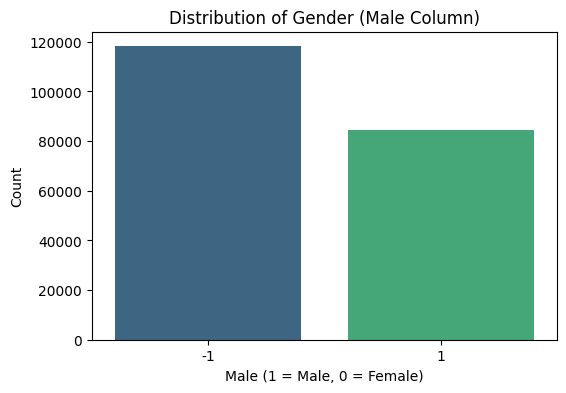

<ipython-input-11-fa680c87000c>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=image_male_young_df, x='Young', palette='plasma')


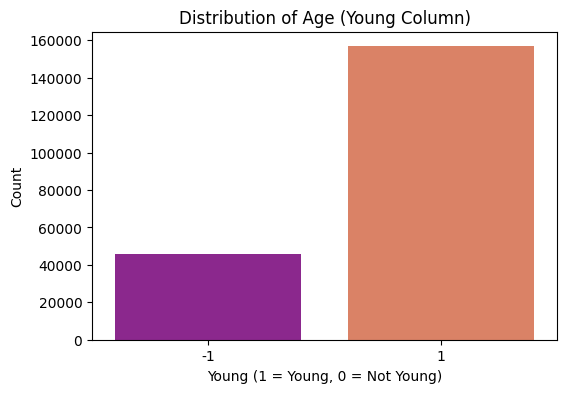

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Check the unique values in 'Male' and 'Young' columns to determine the type of plot
print(image_male_young_df['Male'].value_counts())
print(image_male_young_df['Young'].value_counts())

# Plot the distribution of the 'Male' column
plt.figure(figsize=(6,4))
sns.countplot(data=image_male_young_df, x='Male', palette='viridis')
plt.title('Distribution of Gender (Male Column)')
plt.xlabel('Male (1 = Male, 0 = Female)')
plt.ylabel('Count')
plt.show()

# Plot the distribution of the 'Young' column
plt.figure(figsize=(6,4))
sns.countplot(data=image_male_young_df, x='Young', palette='plasma')
plt.title('Distribution of Age (Young Column)')
plt.xlabel('Young (1 = Young, 0 = Not Young)')
plt.ylabel('Count')
plt.show()

In [12]:
# Calculate the class distribution for 'Male' and 'Young' columns
male_distribution = image_male_young_df['Male'].value_counts(normalize=True)
young_distribution = image_male_young_df['Young'].value_counts(normalize=True)

print("Male Column Distribution:")
print(male_distribution)

print("\nYoung Column Distribution:")
print(young_distribution)

Male Column Distribution:
Male
-1    0.583246
 1    0.416754
Name: proportion, dtype: float64

Young Column Distribution:
Young
 1    0.773617
-1    0.226383
Name: proportion, dtype: float64


In [26]:
from sklearn.utils import resample

# Check the current distribution of Male and Young columns
print("Original Distribution:")
print(image_male_young_df['Male'].value_counts())
print(image_male_young_df['Young'].value_counts())

# Step 1: Separate the data by each column's classes
male_positive = image_male_young_df[image_male_young_df['Male'] == 1]
male_negative = image_male_young_df[image_male_young_df['Male'] == -1]

young_positive = image_male_young_df[image_male_young_df['Young'] == 1]
young_negative = image_male_young_df[image_male_young_df['Young'] == -1]

# Step 2: Determine the minority class size for balancing
min_male_count = min(len(male_positive), len(male_negative))
min_young_count = min(len(young_positive), len(young_negative))

# Step 3: Downsample the majority classes to match the minority class count
male_positive_balanced = resample(male_positive,
                                  replace=False,
                                  n_samples=min_male_count,
                                  random_state=42)

male_negative_balanced = resample(male_negative,
                                  replace=False,
                                  n_samples=min_male_count,
                                  random_state=42)

young_positive_balanced = resample(young_positive,
                                   replace=False,
                                   n_samples=min_young_count,
                                   random_state=42)

young_negative_balanced = resample(young_negative,
                                   replace=False,
                                   n_samples=min_young_count,
                                   random_state=42)

# Step 4: Combine the balanced subsets
balanced_male_df = pd.concat([male_positive_balanced, male_negative_balanced])
balanced_young_df = pd.concat([young_positive_balanced, young_negative_balanced])

# Step 5: Merge the balanced subsets on the 'image_id' column
# This will ensure we only keep rows that exist in both balanced Male and Young subsets
balanced_df = pd.merge(
    balanced_male_df[['image_id', 'Male']],
    balanced_young_df[['image_id', 'Young']],
    on='image_id',
    how='inner'
)

# Display the merged balanced DataFrame
print("Merged Balanced DataFrame:")
print(balanced_df.head())

# Check the final distribution to confirm the balancing
print("\nFinal Distribution:")
print(balanced_df['Male'].value_counts())
print(balanced_df['Young'].value_counts())

# Save the final balanced DataFrame to CSV
output_path = '/content/drive/MyDrive/w210/balanced_image_male_young_df.csv'
balanced_df.to_csv(output_path, index=False)
print(f"Balanced DataFrame saved to {output_path}")


Original Distribution:
Male
-1    118165
 1     84434
Name: count, dtype: int64
Young
 1    156734
-1     45865
Name: count, dtype: int64
Merged Balanced DataFrame:
     image_id  Male  Young
0  171846.jpg     1     -1
1  112331.jpg     1     -1
2  135044.jpg     1     -1
3  069847.jpg     1     -1
4  199368.jpg     1     -1

Final Distribution:
Male
 1    46665
-1    32137
Name: count, dtype: int64
Young
-1    41630
 1    37172
Name: count, dtype: int64
Balanced DataFrame saved to /content/drive/MyDrive/w210/balanced_image_male_young_df.csv


In [27]:
# Path to the CSV file in Google Drive
csv_path = '/content/drive/MyDrive/w210/balanced_image_male_young_df.csv'

# Load the CSV into a DataFrame
balanced_image_male_young_df = pd.read_csv(csv_path)

# Display the first few rows to verify the data
print("Loaded Balanced DataFrame:")
print(balanced_image_male_young_df.head())

# Check the total number of rows and columns
print(f"Number of rows: {len(balanced_image_male_young_df)}")
print(f"Columns: {balanced_image_male_young_df.columns.tolist()}")

Loaded Balanced DataFrame:
     image_id  Male  Young
0  171846.jpg     1     -1
1  112331.jpg     1     -1
2  135044.jpg     1     -1
3  069847.jpg     1     -1
4  199368.jpg     1     -1
Number of rows: 78802
Columns: ['image_id', 'Male', 'Young']


<ipython-input-28-5e8568d70095>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=balanced_image_male_young_df, x='Male', palette='viridis')


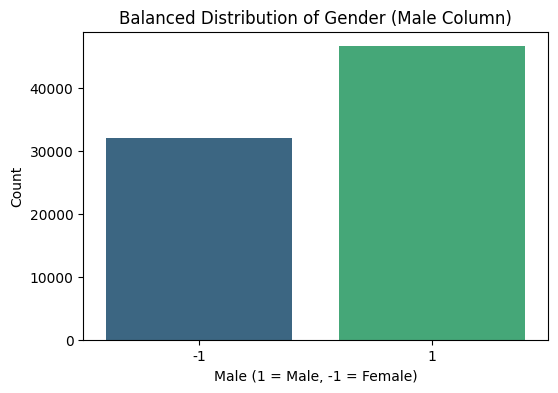

<ipython-input-28-5e8568d70095>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=balanced_image_male_young_df, x='Young', palette='plasma')


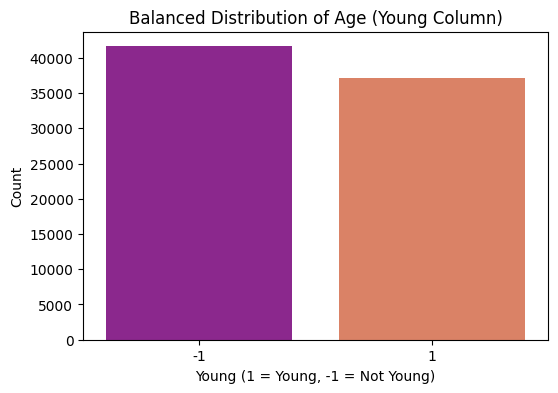

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualization of Male Distribution
plt.figure(figsize=(6,4))
sns.countplot(data=balanced_image_male_young_df, x='Male', palette='viridis')
plt.title('Balanced Distribution of Gender (Male Column)')
plt.xlabel('Male (1 = Male, -1 = Female)')
plt.ylabel('Count')
plt.show()

# Visualization of Young Distribution
plt.figure(figsize=(6,4))
sns.countplot(data=balanced_image_male_young_df, x='Young', palette='plasma')
plt.title('Balanced Distribution of Age (Young Column)')
plt.xlabel('Young (1 = Young, -1 = Not Young)')
plt.ylabel('Count')
plt.show()

In [29]:
# Calculate the class distribution for 'Male' and 'Young' columns
male_distribution_b = balanced_image_male_young_df['Male'].value_counts(normalize=True)
young_distribution_b = balanced_image_male_young_df['Young'].value_counts(normalize=True)

print("Male Column Distribution:")
print(male_distribution_b)

print("\nYoung Column Distribution:")
print(young_distribution_b)

Male Column Distribution:
Male
 1    0.59218
-1    0.40782
Name: proportion, dtype: float64

Young Column Distribution:
Young
-1    0.528286
 1    0.471714
Name: proportion, dtype: float64


In [30]:
# Separate majority and minority classes
male_majority = balanced_image_male_young_df[balanced_image_male_young_df['Male'] == 1]
male_minority = balanced_image_male_young_df[balanced_image_male_young_df['Male'] == -1]

# Undersample the majority class
male_majority_undersampled = resample(male_majority,
                                      replace=False,
                                      n_samples=len(male_minority),
                                      random_state=42)

# Combine the undersampled majority class with the minority class
balanced_male_female_df = pd.concat([male_majority_undersampled, male_minority])

print(balanced_male_female_df['Male'].value_counts(normalize=True))

Male
 1    0.5
-1    0.5
Name: proportion, dtype: float64


<ipython-input-31-02eb8c5a75f3>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=balanced_male_female_df, x='Male', palette='viridis')


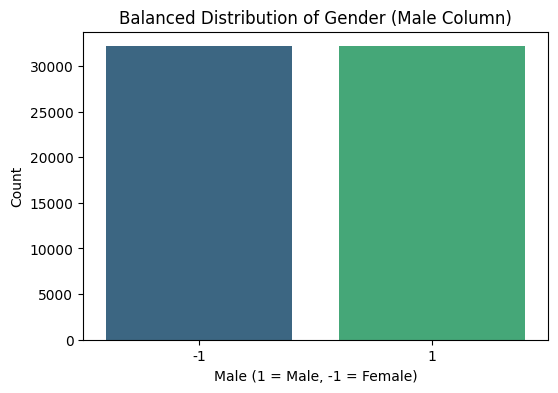

<ipython-input-31-02eb8c5a75f3>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=balanced_male_female_df, x='Young', palette='plasma')


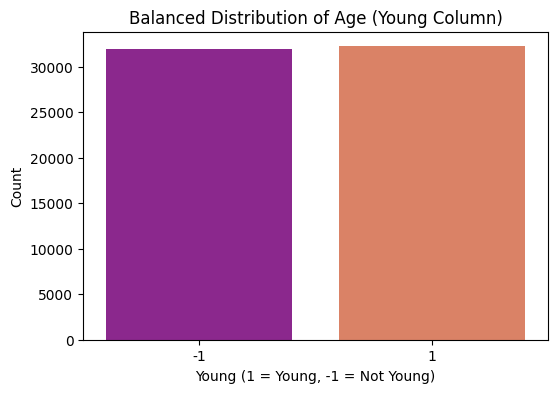

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualization of Male Distribution
plt.figure(figsize=(6,4))
sns.countplot(data=balanced_male_female_df, x='Male', palette='viridis')
plt.title('Balanced Distribution of Gender (Male Column)')
plt.xlabel('Male (1 = Male, -1 = Female)')
plt.ylabel('Count')
plt.show()

# Visualization of Young Distribution
plt.figure(figsize=(6,4))
sns.countplot(data=balanced_male_female_df, x='Young', palette='plasma')
plt.title('Balanced Distribution of Age (Young Column)')
plt.xlabel('Young (1 = Young, -1 = Not Young)')
plt.ylabel('Count')
plt.show()

In [32]:
# Check the new balanced distribution
print("\nBalanced Distribution:")
print(balanced_male_female_df['Male'].value_counts())
print(balanced_male_female_df['Young'].value_counts())


Balanced Distribution:
Male
 1    32137
-1    32137
Name: count, dtype: int64
Young
 1    32255
-1    32019
Name: count, dtype: int64


In [33]:
balanced_male_female_df.describe()

,Male,Young
count,64274.000000,64274.000000
mean,0.000000,0.003672
std,1.000008,1.000001
min,-1.000000,-1.000000
25%,-1.000000,-1.000000
50%,0.000000,1.000000
75%,1.000000,1.000000
max,1.000000,1.000000


In [34]:
# Create a crosstab (contingency table) for the relationship between 'Young' and 'Male'
crosstab = pd.crosstab(balanced_male_female_df['Young'], balanced_male_female_df['Male'])

# Display the crosstab to verify
print(crosstab)

Male      -1      1
Young              
-1     10643  21376
 1     21494  10761


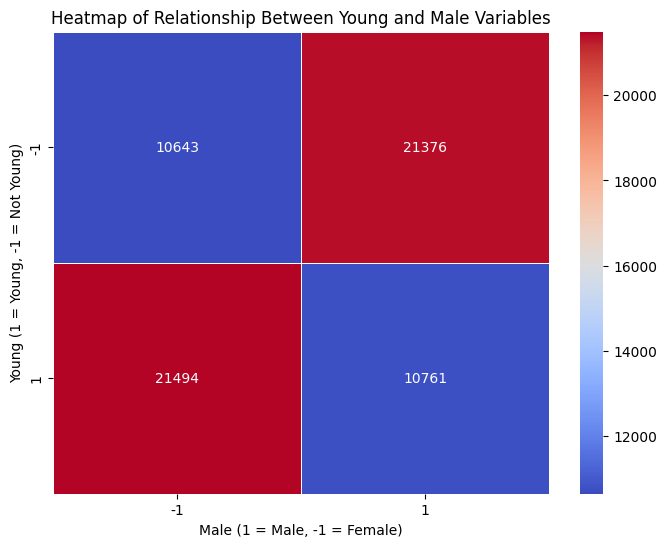

In [35]:
plt.figure(figsize=(8, 6))

# Create the heatmap using seaborn
sns.heatmap(crosstab, annot=True, cmap='coolwarm', fmt='d', linewidths=0.5)

# Add labels and title
plt.xlabel('Male (1 = Male, -1 = Female)')
plt.ylabel('Young (1 = Young, -1 = Not Young)')
plt.title('Heatmap of Relationship Between Young and Male Variables')

# Show the plot
plt.show()


In [36]:
# Define the save path in your Google Drive
save_path = '/content/drive/MyDrive/w210/balanced_male_female_df.csv'

# Save the DataFrame as a CSV file
balanced_male_female_df.to_csv(save_path, index=False)

print(f'DataFrame saved to {save_path}')

DataFrame saved to /content/drive/MyDrive/w210/balanced_male_female_df.csv


In [41]:
ls /content/drive/MyDrive/w210

balanced_male_female_df.csv  list_attr_celeba.csv  list_eval_partition.csv
img_align_celeba/            list_bbox_celeba.csv  list_landmarks_align_celeba.csv


In [37]:
import pandas as pd

# Load the DataFrame from the saved CSV
balanced_male_female_df = pd.read_csv('/content/drive/MyDrive/w210/balanced_male_female_df.csv')
print(balanced_male_female_df.head())

     image_id  Male  Young
0  139696.jpg     1     -1
1  001854.jpg     1     -1
2  005430.jpg     1     -1
3  189118.jpg     1      1
4  162763.jpg     1     -1


In [38]:
import os
import matplotlib.pyplot as plt
from PIL import Image

In [39]:
# Path to the images folder
image_folder = '/content/drive/MyDrive/w210/img_align_celeba/img_align_celeba'


# List all image files in the folder
image_files = os.listdir(image_folder)

# Show the first 10 image filenames to verify
print(image_files[:10])

KeyboardInterrupt: 

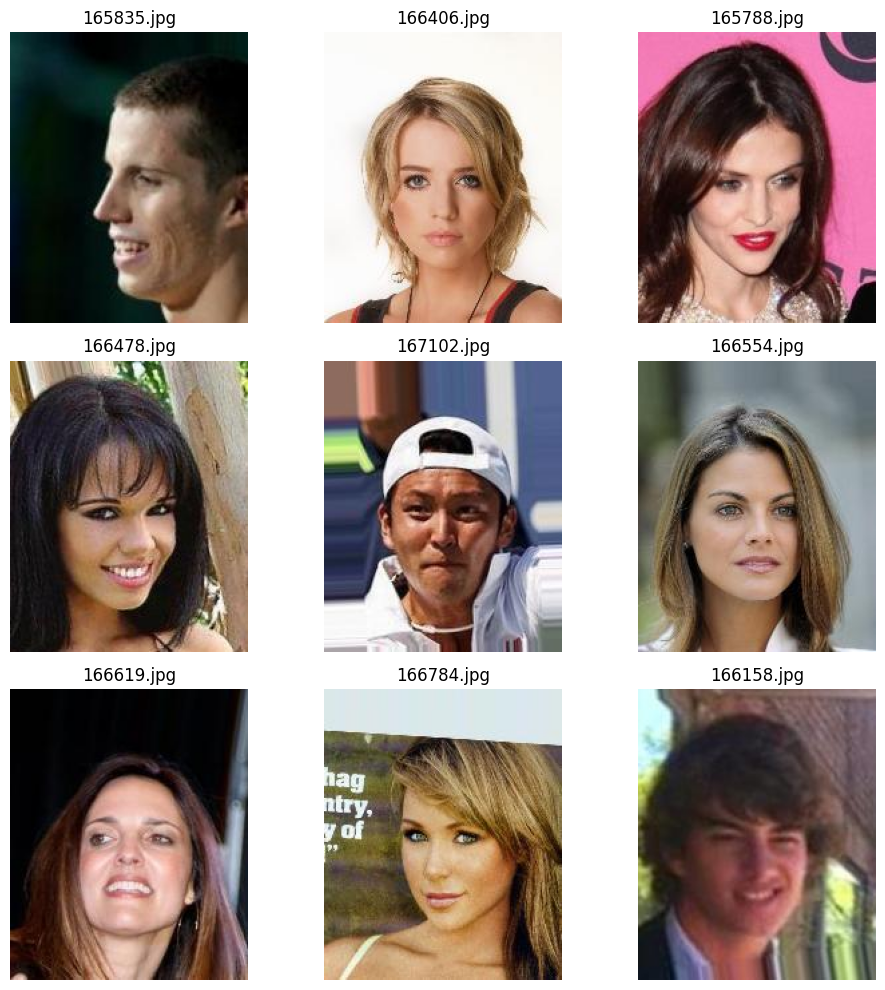

In [45]:
# Number of images to display
num_images = 9  # 3x3 grid
sample_images = image_files[:num_images]

# Set up a grid to display the images
plt.figure(figsize=(10, 10))

for i, image_name in enumerate(sample_images):
    img_path = os.path.join(image_folder, image_name)
    img = Image.open(img_path)

    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_name)

plt.tight_layout()
plt.show()
